Importing Libraries

In [ ]:
import boto3
import os
from PIL import Image
import pandas as pd
import os
import cv2
import numpy as np
from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import json
from openai import OpenAI
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, classification_report
from concurrent.futures import ThreadPoolExecutor, as_completed
from sklearn.metrics import confusion_matrix, classification_report
import matplotlib.pyplot as plt



In [ ]:
input_dir = "/content/Images"
output_dir = "RGB_final"
"""
Converting the images in dataset to RGBA format to support GPT Vision
"""
if not os.path.exists(output_dir):
    os.makedirs(output_dir)

for filename in os.listdir(input_dir):

    if filename.endswith(('.png', '.jpg', '.jpeg', '.gif')):
        image_path = os.path.join(input_dir, filename)
        with Image.open(image_path) as img:
            if img.mode != 'RGB' and img.mode != 'RGBA':
                img = img.convert('RGBA')
            img.save(os.path.join(output_dir, filename))


In [ ]:
"""
Uploading to s3 Bucket to create public URL
"""
AWS_ACCESS_KEY = ''
AWS_SECRET_KEY = ''
BUCKET_NAME = ''
LOCAL_FOLDER = '/content/RGB_final'
s3 = boto3.client(
    's3',
    aws_access_key_id=AWS_ACCESS_KEY,
    aws_secret_access_key=AWS_SECRET_KEY
)

for filename in os.listdir(LOCAL_FOLDER):
    if filename.endswith(('.png', '.jpg', '.jpeg')):
        local_file_path = os.path.join(LOCAL_FOLDER, filename)
        s3.upload_file(local_file_path, BUCKET_NAME, filename)
        print(f'Uploaded {filename} to {BUCKET_NAME}')


In [ ]:

df = pd.read_csv('/content/FETAL_PLANES_DB_data.csv', delimiter=';')
image_folder = '/content/Images'

Creating JSONL file for GPT Vision finetuning

In [ ]:
train_df, test_df = train_test_split(df, test_size=0.1, stratify=df['Plane'], random_state=1)

test_image_names = test_df['Image_name'].tolist()

print("Test Image Names:", test_image_names)

with open('test_image_names.txt', 'w') as test_file:
    for image_name in test_image_names:
        test_file.write(image_name + '\n')

with open('fetal_planes_train_only.jsonl', 'w') as jsonl_file:

    for index, row in train_df.iterrows():
        image_name = row['Image_name']

        image_url = os.path.join("{INSERT - S3 - URL}", f"{image_name}.png")

        plane = row['Plane']

        conversation = {
            "messages": [
                {
                    "role": "system",
                    "content": "You are an assistant that identifies fetal ultrasound planes."
                },
                {
                    "role": "user",
                    "content": "What is this plane called?"
                },
                {
                    "role": "user",
                    "content": [
                        {
                            "type": "image_url",
                            "image_url": {
                                "url": image_url,
                                "detail": "low"
                            }
                        }
                    ]
                },
                {
                    "role": "assistant",
                    "content": plane
                }
            ]
        }

        jsonl_file.write(json.dumps(conversation) + '\n')

print("JSONL file with training instances has been created.")
print("Test image names have been written to test_image_names.txt.")


Test Image Names: ['Patient01477_Plane3_5_of_5', 'Patient00771_Plane1_8_of_40', 'Patient01513_Plane1_8_of_14', 'Patient01614_Plane1_1_of_9', 'Patient00963_Plane6_3_of_3', 'Patient00443_Plane4_1_of_1', 'Patient00893_Plane3_1_of_2', 'Patient00801_Plane5_1_of_1', 'Patient01165_Plane5_2_of_2', 'Patient00842_Plane6_3_of_4', 'Patient01275_Plane2_1_of_2', 'Patient00403_Plane4_1_of_1', 'Patient00041_Plane1_36_of_45', 'Patient01311_Plane3_1_of_1', 'Patient00029_Plane1_13_of_16', 'Patient01275_Plane1_2_of_9', 'Patient00708_Plane6_1_of_2', 'Patient01648_Plane5_1_of_5', 'Patient00882_Plane6_2_of_7', 'Patient01388_Plane6_3_of_5', 'Patient00005_Plane1_11_of_25', 'Patient01318_Plane3_2_of_3', 'Patient01175_Plane1_1_of_1', 'Patient01287_Plane1_1_of_10', 'Patient01279_Plane3_1_of_1', 'Patient01116_Plane3_3_of_3', 'Patient00821_Plane3_2_of_3', 'Patient01509_Plane1_13_of_13', 'Patient00859_Plane4_4_of_7', 'Patient00707_Plane2_1_of_2', 'Patient00006_Plane1_6_of_36', 'Patient01770_Plane6_2_of_4', 'Patient0

FINETUNING GPT VISION

In [ ]:
!export OPENAI_API_KEY=""

In [ ]:
client = OpenAI()

client.files.create(
  file=open("/content/fetal_planes_train_only.jsonl", "rb"),
  purpose="fine-tune"
)

FileObject(id='file-oWoofVTdEP0OqTVpBQZDXZzO', bytes=4253688, created_at=1729469088, filename='fetal_planes_train_only.jsonl', object='file', purpose='fine-tune', status='processed', status_details=None)

In [ ]:
client = OpenAI()

client.fine_tuning.jobs.create(
  training_file='file-oWoofVTdEP0OqTVpBQZDXZzO',
  model="gpt-4o-2024-08-06"
)

FineTuningJob(id='ftjob-cJZfFJIQ2Ob3krkS6GLmlFuB', created_at=1729469098, error=Error(code=None, message=None, param=None), fine_tuned_model=None, finished_at=None, hyperparameters=Hyperparameters(n_epochs='auto', batch_size='auto', learning_rate_multiplier='auto'), model='gpt-4o-2024-08-06', object='fine_tuning.job', organization_id='org-X1UyVq3wmkI7hjqUO6riWmJQ', result_files=[], seed=1802876800, status='validating_files', trained_tokens=None, training_file='file-oWoofVTdEP0OqTVpBQZDXZzO', validation_file=None, estimated_finish=None, integrations=[], user_provided_suffix=None)

In [ ]:


from openai import OpenAI
client = OpenAI()

# client.fine_tuning.jobs.retrieve('ftjob-KaxozpsXYAPu4h1Ykg6Kly7l')

client.fine_tuning.jobs.list_events(fine_tuning_job_id='ftjob-cJZfFJIQ2Ob3krkS6GLmlFuB', limit=10)


SyncCursorPage[FineTuningJobEvent](data=[FineTuningJobEvent(id='ftevent-233WUf7ScuCbjRX8AuVe1hpw', created_at=1729472511, level='error', message='Creating this fine-tuning job would exceed your hard limit, please check your plan and billing details.                     Cost of job ftjob-cJZfFJIQ2Ob3krkS6GLmlFuB: USD 66.75. Quota remaining for org-X1UyVq3wmkI7hjqUO6riWmJQ: USD 57.27.', object='fine_tuning.job.event', data={'error_code': 'exceeded_quota'}, type='message'), FineTuningJobEvent(id='ftevent-xxvslJju796pzy8JXS0FZ85x', created_at=1729472186, level='warn', message='Training file file-oWoofVTdEP0OqTVpBQZDXZzO contains 189 examples with images that were skipped for the following reasons: contains people, inaccessible URL. These examples will not be used for training. Please visit our docs to learn how to resolve these issues. Using 10971 examples from training file file-oWoofVTdEP0OqTVpBQZDXZzO.', object='fine_tuning.job.event', data={}, type='message'), FineTuningJobEvent(id='ft

TESTING WITH SINGLE INSTANCE

In [ ]:
client = OpenAI()

completion = client.chat.completions.create(
  model='ft:gpt-4o-2024-08-06:attri::AKYGXHDK',
  messages=[
    {"role": "system", "content": "You are an assistant that identifies fetal ultrasound planes."}, {"role": "user", "content": "What is this plane called?"}, {"role": "user", "content": [{"type": "image_url", "image_url": {"url": "{INSERT - S3 - PATH}", "detail": "low"}}]}]

)
print(completion.choices[0].message)


ChatCompletionMessage(content='Other', refusal=None, role='assistant', audio=None, function_call=None, tool_calls=None)


In [ ]:
client = OpenAI()

completion = client.chat.completions.create(
  model='ft:gpt-4o-2024-08-06:attri::AKYGXHDK',
  messages=[
    {"role": "system", "content": "You are an assistant that identifies fetal ultrasound planes."}, {"role": "user", "content": "What is the confidence score that the following plane is Other?"}, {"role": "user", "content": [{"type": "image_url", "image_url": {"url": "https://mvpimages1.s3.amazonaws.com/Patient00001_Plane1_1_of_15.png", "detail": "low"}}]}]

)
print(completion.choices[0].message)


ChatCompletionMessage(content='99', refusal=None, role='assistant', audio=None, function_call=None, tool_calls=None)


ACCURACY MATRIX CALCULATIONS

In [ ]:


client = OpenAI()
with open('/content/test_image_names.txt', 'r') as f:
    image_paths = [line.strip() for line in f.readlines()]


In [ ]:
import random


sample_size = int(0.8 * len(image_paths))
image_paths = random.sample(image_paths, sample_size)
print(image_paths)


['Patient00781_Plane6_2_of_5', 'Patient01497_Plane5_1_of_1', 'Patient00002_Plane1_7_of_20', 'Patient01732_Plane2_1_of_1', 'Patient00168_Plane6_1_of_4', 'Patient00042_Plane1_38_of_39', 'Patient00615_Plane4_1_of_1', 'Patient01185_Plane1_8_of_15', 'Patient00907_Plane5_1_of_2', 'Patient00004_Plane1_2_of_30', 'Patient01483_Plane3_1_of_4', 'Patient00867_Plane6_4_of_4', 'Patient00088_Plane4_1_of_2', 'Patient01014_Plane2_1_of_1', 'Patient00849_Plane6_6_of_7', 'Patient01176_Plane4_4_of_4', 'Patient01189_Plane5_1_of_2', 'Patient01018_Plane6_1_of_1', 'Patient01345_Plane3_5_of_5', 'Patient00579_Plane4_1_of_1', 'Patient01782_Plane3_2_of_2', 'Patient00170_Plane4_1_of_1', 'Patient00880_Plane4_1_of_4', 'Patient01611_Plane1_1_of_1', 'Patient00775_Plane6_1_of_3', 'Patient01118_Plane3_6_of_6', 'Patient01759_Plane3_1_of_3', 'Patient01023_Plane4_2_of_2', 'Patient01307_Plane3_2_of_2', 'Patient00986_Plane3_3_of_4', 'Patient01322_Plane1_1_of_1', 'Patient01367_Plane1_4_of_8', 'Patient01739_Plane3_1_of_3', 'Pat

In [ ]:

"""
Function to get predictions for each image
"""
def get_prediction(image_url):
    try:
        image_url=image_url+".png"
        completion = client.chat.completions.create(
            model='ft:gpt-4o-2024-08-06:attri::AKYGXHDK',
            messages=[
                {"role": "system", "content": "You are an assistant that identifies fetal ultrasound planes."},
                {"role": "user", "content": "What is this plane called?"},
                {"role": "user", "content": [{"type": "image_url", "image_url": {"url": "https://mvpimages1.s3.amazonaws.com/"+image_url}}]}
            ]
        )

        predicted_plane = completion.choices[0].message.content
        return image_url, predicted_plane

    except Exception as e:
        print(f"Error processing {image_url}: {e}")
        return image_url, None

actuals_df = pd.read_csv('/content/FETAL_PLANES_DB_data.csv', delimiter=';')

actuals_df['Prediction'] = None

"""
Function to run the predictions in parallel
"""
def process_images_parallel(image_paths, max_workers=10):
    predictions = {}
    with ThreadPoolExecutor(max_workers=max_workers) as executor:
        future_to_image = {executor.submit(get_prediction, img): img for img in image_paths}

        for future in as_completed(future_to_image):
            image_url, prediction = future.result()
            predictions[image_url] = prediction

    return predictions

predictions = process_images_parallel(image_paths)
print(predictions.items())
for image_path, prediction in predictions.items():
    image_name = image_path.split('/')[-1]
    image_name = image_path.split('.')[0]
    print(image_name)
    print((actuals_df['Image_name'] == image_name).unique())
    actuals_df.loc[actuals_df['Image_name'] == image_name, 'Prediction'] = prediction

y_true = actuals_df['Plane']
y_pred = actuals_df['Prediction']
actuals_df.to_csv('results_with_predictions_full.csv', index=False)


In [ ]:
actuals_df.to_csv('results_with_predictions_80.csv', index=False)


In [ ]:
actuals_df = actuals_df.dropna()

In [ ]:
len(actuals_df)

1984

In [ ]:
len(image_paths)

2480

In [ ]:
actuals_df.head(4)

,Image_name,Patient_num,Plane,Brain_plane,Operator,US_Machine,Train,Prediction
1,Patient00001_Plane1_2_of_15,1,Other,Not A Brain,Other,Aloka,1,Other
2,Patient00001_Plane1_3_of_15,1,Other,Not A Brain,Other,Aloka,1,Other
21,Patient00002_Plane1_7_of_20,2,Other,Not A Brain,Other,Aloka,1,Other
24,Patient00002_Plane1_10_of_20,2,Other,Not A Brain,Other,Aloka,1,Other


In [ ]:
y_true = actuals_df['Plane']
y_pred = actuals_df['Prediction']
conf_matrix = confusion_matrix(y_true, y_pred)
class_report = classification_report(y_true, y_pred)
print("Confusion Matrix:")
print(conf_matrix)
print("\nClassification Report:")
print(class_report)


Confusion Matrix:
[[  0   0   0   0   0   0   0   0   0   0   0   0   0   0]
 [  0   0   0   0   0   0   0   0   0   0   0   0   0   0]
 [  0   0   0   0   0   0   0   0   0   0   0   0   0   0]
 [  0   0   0  94   0   5   0   0   0   2   0   0   0   3]
 [  0   0   0   0   0   0   0   0   0   0   0   0   0   0]
 [  0   0   0   1   0 498   0   0   0   0   0   0   0   2]
 [  0   0   0   0   0   1 145   0   0   0   0   0   0  21]
 [  0   0   0   0   0   0   0   0   0   0   0   0   0   0]
 [  0   0   0   0   0   0   0   0   0   0   0   0   0   0]
 [  0   0   0  19   1  15   6   1   1 212   0   0   0   7]
 [  0   0   0   0   0   0   0   0   0   0   0   0   0   0]
 [  0   0   0   0   0   0   0   0   0   0   0   0   0   0]
 [  1   0   0   0   0   1   0   0   0   0   0   0 244   9]
 [  0   1   1  13   0  14  36   0   0  15   1   1   3 610]]

Classification Report:
                                                     precision    recall  f1-score   support

                                     

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [ ]:
correct_predictions = sum(y_true == y_pred)
total_predictions = len(y_true)
accuracy = correct_predictions / total_predictions
print(f"Overall Accuracy: {accuracy:.2f}")


Overall Accuracy: 0.91


In [ ]:

classes_of_interest = [
    'Fetal abdomen',
    'Fetal brain',
    'Fetal femur',
    'Fetal thorax',
    'Maternal cervix',
    'Other'
]

class_report = classification_report(y_true, y_pred, labels=classes_of_interest, output_dict=True)
class_wise_recall = {label: metrics['recall'] for label, metrics in class_report.items() if label in classes_of_interest}
macro_avg_recall = class_report['macro avg']['recall']
print("Class-wise Recall:")
for label, recall in class_wise_recall.items():
    print(f"{label}: {recall:.2f}")

print(f"\nMacro Average Recall (Unweighted): {macro_avg_recall:.2f}")

Class-wise Recall:
Fetal abdomen: 0.90
Fetal brain: 0.99
Fetal femur: 0.87
Fetal thorax: 0.81
Maternal cervix: 0.96
Other: 0.88

Macro Average Recall (Unweighted): 0.90


In [ ]:
"""
TRYING TO GET PREDICTION SCORES FROM GPT VISION ITSELF FOR 25 RANDOM IMAGES
"""
client = OpenAI()

def get_confidence_score(image_url, prediction):
    image_url=image_url+".png"
    completion = client.chat.completions.create(
        model='ft:gpt-4o-2024-08-06:attri::AKYGXHDK',
        messages=[
            {"role": "system", "content": "You are an assistant that identifies fetal ultrasound planes."},
            {"role": "user", "content": f"What is the confidence score that the following plane is {prediction}?"},
            {"role": "user", "content": [{"type": "image_url", "image_url": {"url": "{INSERT IMAGE URL S3}"+image_url, "detail": "low"}}]}
        ]
    )
    return completion.choices[0].message.content
csv_file = '/content/results_with_predictions_full.csv'
df = pd.read_csv(csv_file)
df.dropna(subset=['Prediction'], inplace=True)
planes_dict = df.groupby('Plane').apply(lambda x: x[['Image_name', 'Prediction']].to_dict(orient='records')).to_dict()

def process_images(planes_dict):
    confidence_scores = []

    for plane_class, images in planes_dict.items():
        selected_images = random.sample(images, min(25, len(images)))

        for img_data in selected_images:
            image_url = img_data['Image_name']
            prediction = img_data['Prediction']

            try:
                confidence = get_confidence_score(image_url, prediction)
                confidence_scores.append({
                    'Plane': plane_class,
                    'Image': image_url,
                    'Prediction': prediction,
                    'Confidence_Score': confidence
                })
            except Exception as e:
                print(f"Error processing image {image_url}: {e}")
                continue

    return confidence_scores

confidence_scores = process_images(planes_dict)
for score in confidence_scores:
    print(f"Plane: {score['Plane']}, Image: {score['Image']}, Prediction: {score['Prediction']}, Confidence Score: {score['Confidence_Score']}")


<ipython-input-30-d1357abc8f75>:36: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  planes_dict = df.groupby('Plane').apply(lambda x: x[['Image_name', 'Prediction']].to_dict(orient='records')).to_dict()


Plane: Fetal abdomen, Image: Patient00915_Plane2_1_of_1, Prediction: Fetal abdomen, Confidence Score: 90
Plane: Fetal abdomen, Image: Patient01240_Plane2_1_of_1, Prediction: Fetal thorax, Confidence Score: The image shows a fetal abdomen. The confidence score for fetal thorax is 0%.
Plane: Fetal abdomen, Image: Patient01508_Plane2_1_of_1, Prediction: Fetal abdomen, Confidence Score: Fetal abdomen
Plane: Fetal abdomen, Image: Patient01193_Plane2_1_of_1, Prediction: Fetal abdomen, Confidence Score: 0.06
Plane: Fetal abdomen, Image: Patient01668_Plane2_1_of_1, Prediction: Fetal abdomen, Confidence Score: Fetal abdomen
Plane: Fetal abdomen, Image: Patient00738_Plane2_1_of_1, Prediction: Other, Confidence Score: Other
Plane: Fetal abdomen, Image: Patient01726_Plane2_1_of_1, Prediction: Fetal abdomen, Confidence Score: The displayed ultrasound image is a fetal abdomen.
Plane: Fetal abdomen, Image: Patient01110_Plane2_1_of_1, Prediction: Fetal abdomen, Confidence Score: Fetal abdomen
Plane: F

TRIAL TO GET GRADMAPS

Other
(448, 740, 3)


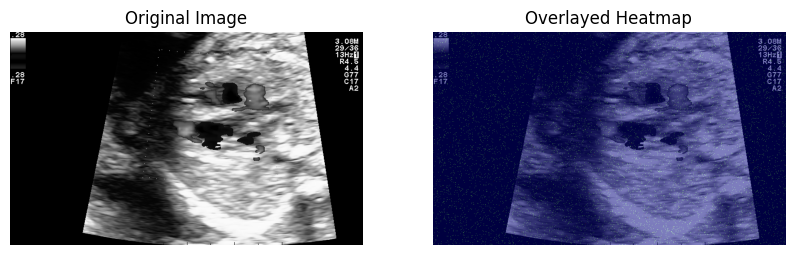

Other
(480, 692, 3)


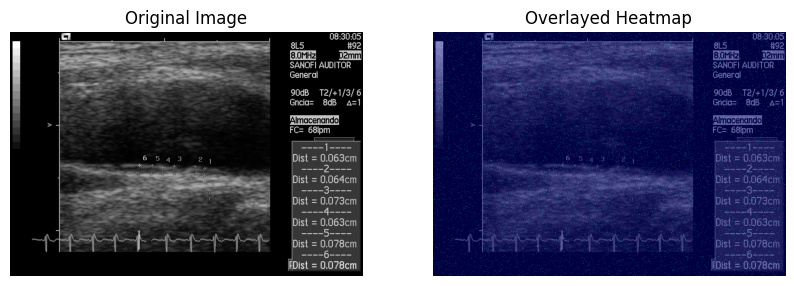

Other
(661, 959, 3)


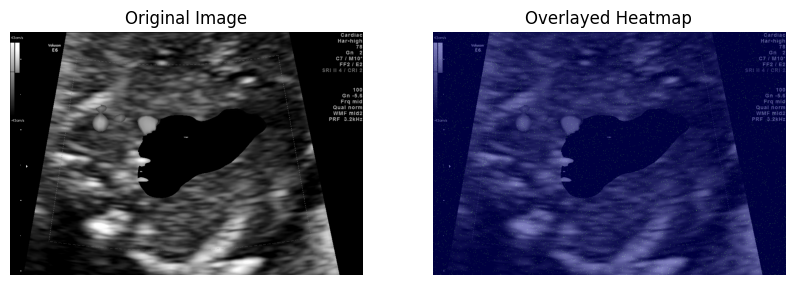

Other
(448, 740, 3)


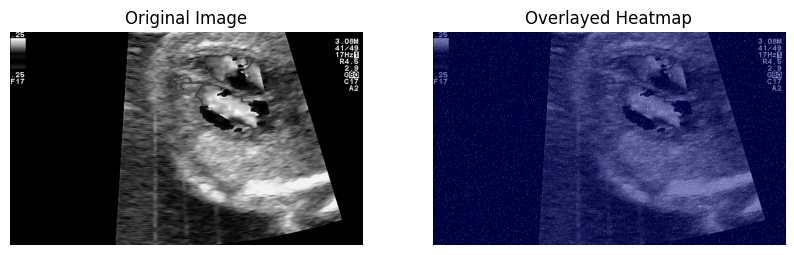

Fetal femur
(787, 1137, 3)


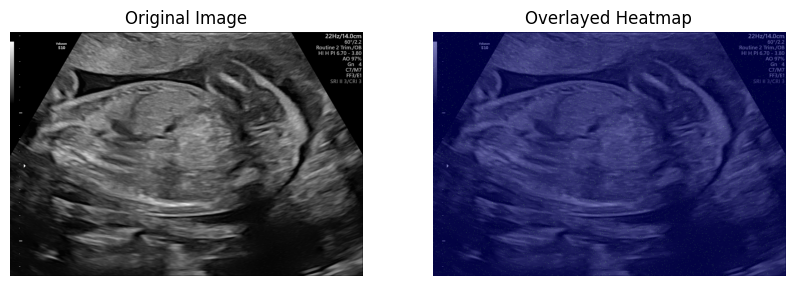

Fetal Doppler
(480, 692, 3)


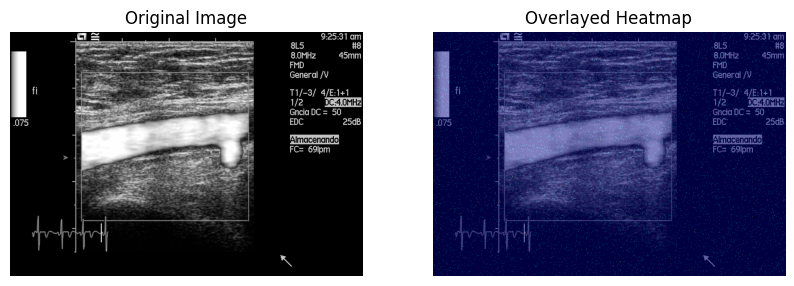

Fetal thorax
(392, 640, 3)


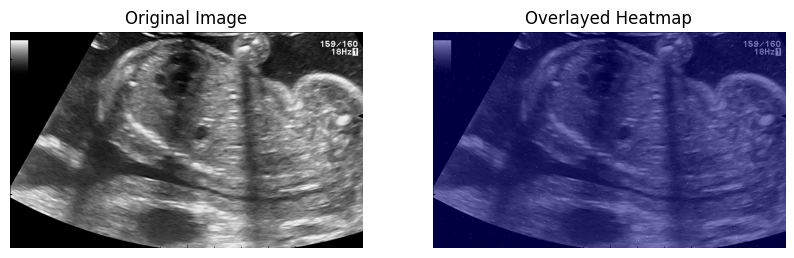

Fetal abdomen
(661, 959, 3)


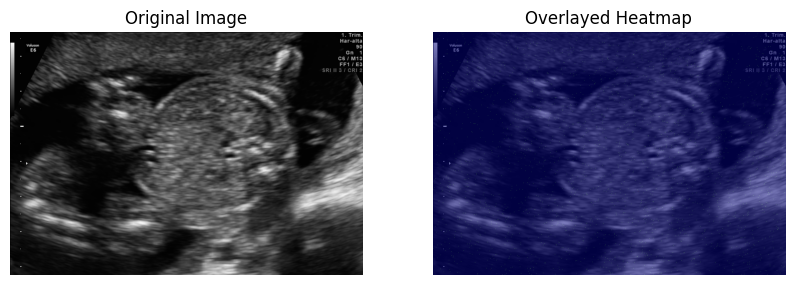

Maternal cervix
(661, 959, 3)


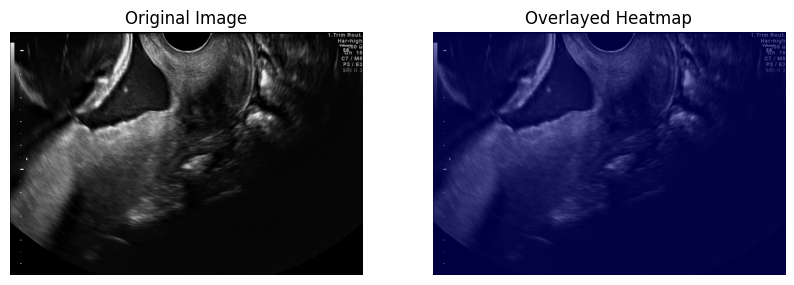

Maternal cervix
(661, 959, 3)


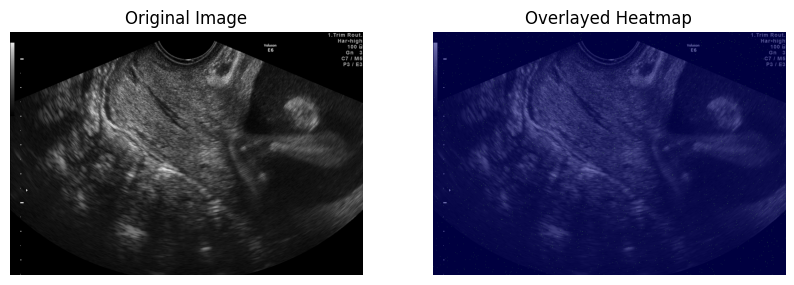

Maternal cervix
(559, 745, 3)


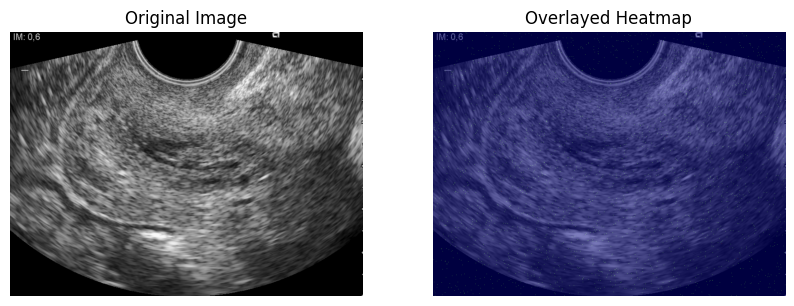

Maternal cervix
(663, 961, 3)


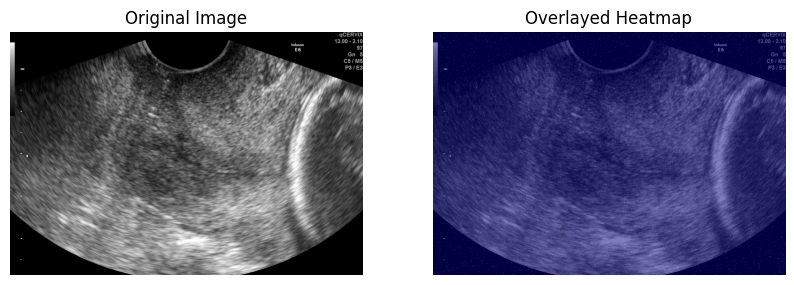

Other
(661, 959, 3)


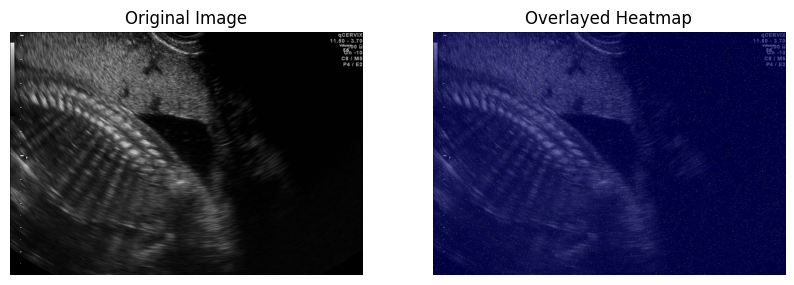

Fetal brain
(392, 640, 3)


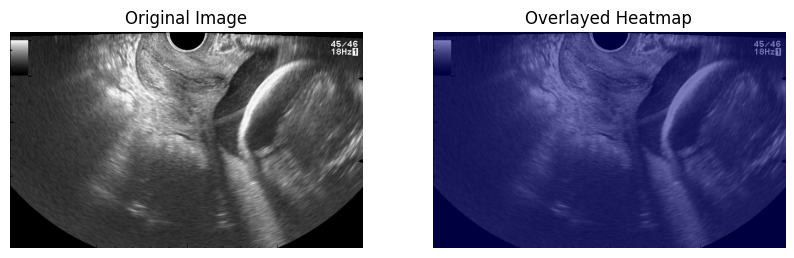

Other
(787, 1137, 3)


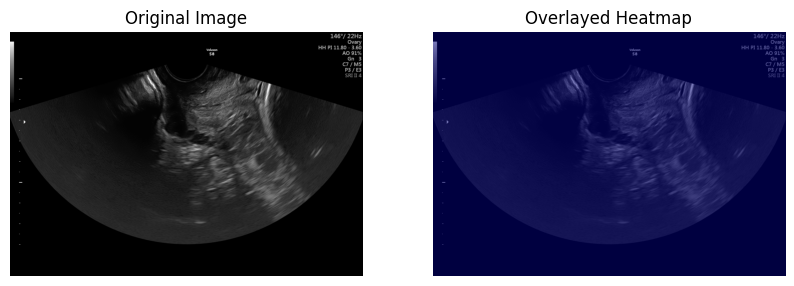

Other
(559, 745, 3)


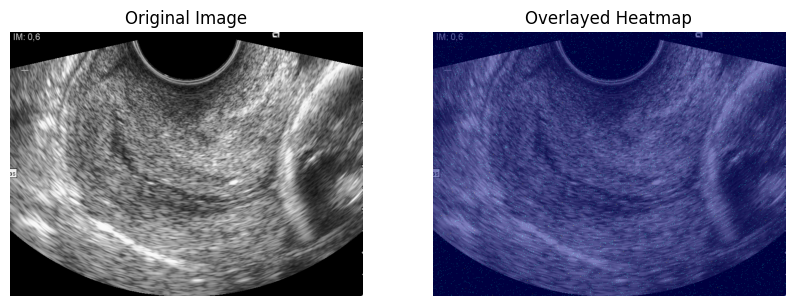

Fetal brain
(661, 959, 3)


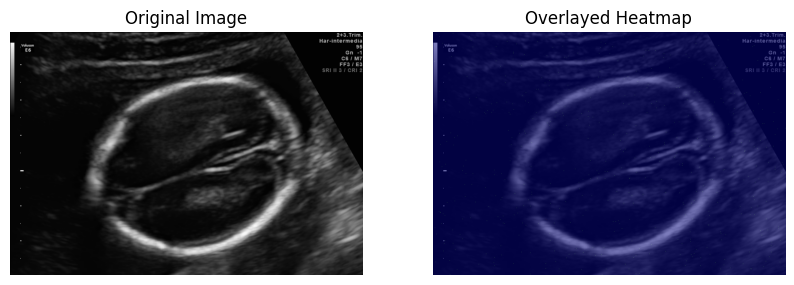

Fetal brain
(392, 640, 3)


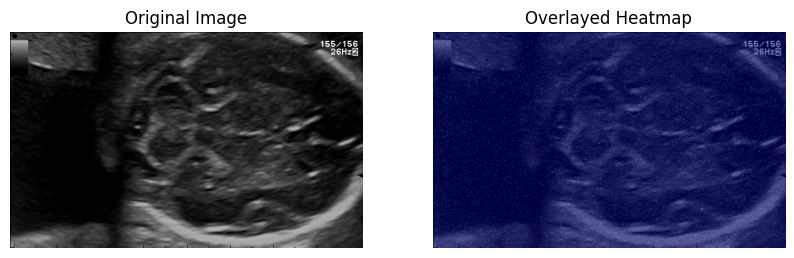

Fetal brain
(661, 959, 3)


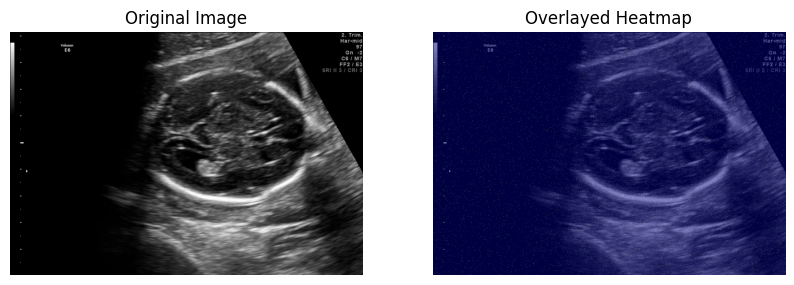

Fetal brain
(663, 961, 3)


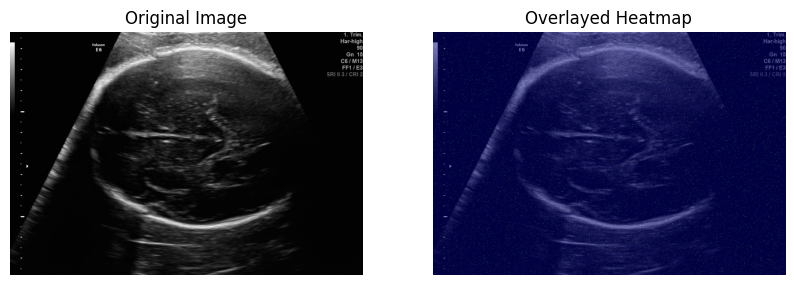

Fetal thorax
(392, 640, 3)


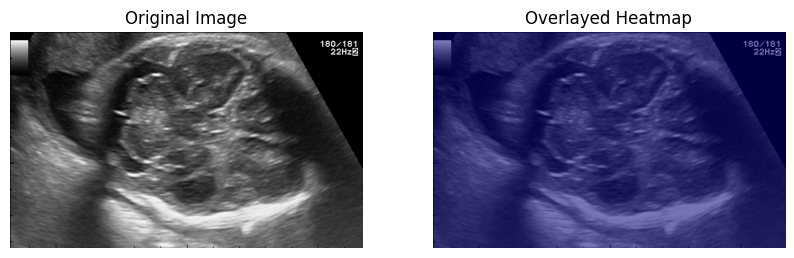

Fetal thorax
(392, 640, 3)


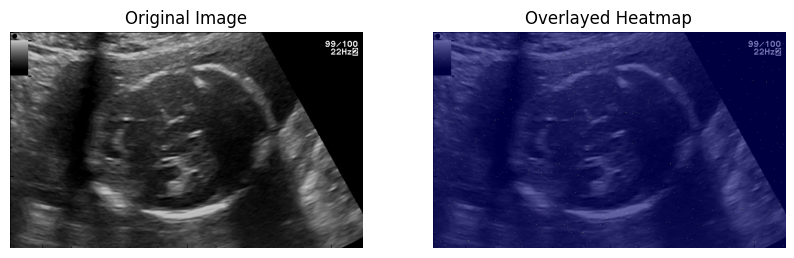

Other
(661, 959, 3)


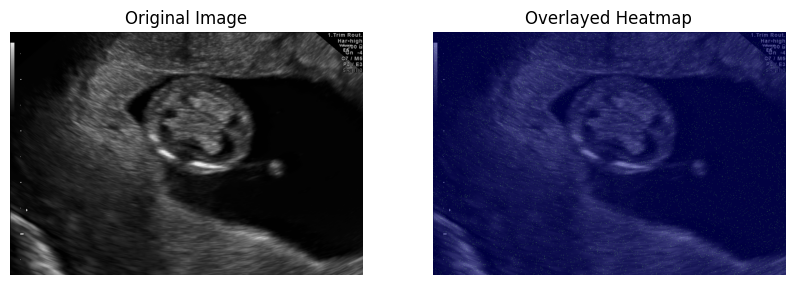

Other
(392, 640, 3)


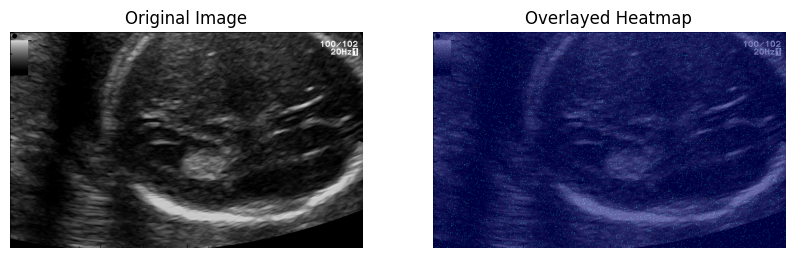

Fetal femur
(392, 640, 3)


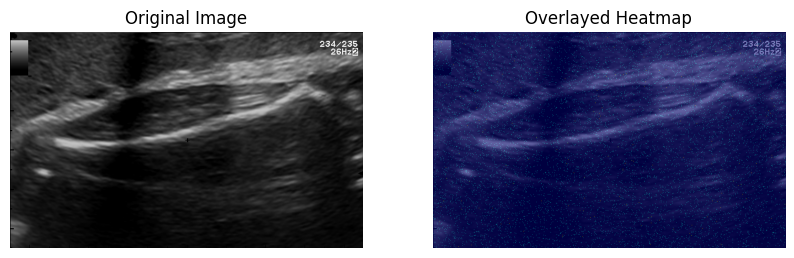

Fetal femur
(661, 959, 3)


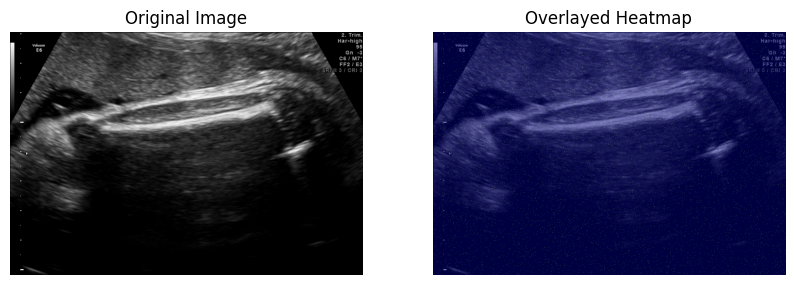

Fetal femur
(661, 959, 3)


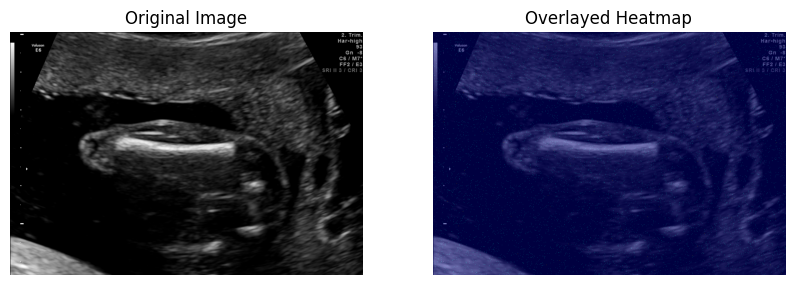

Fetal femur
(392, 640, 3)


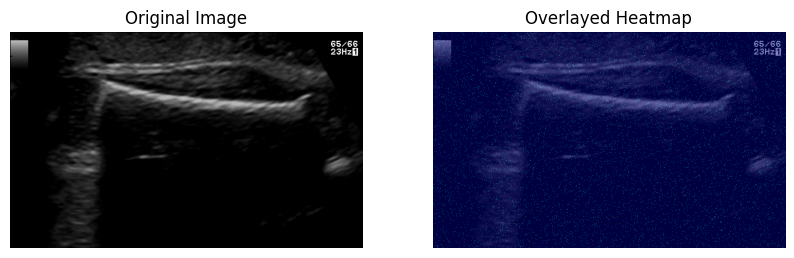

Fetal abdomen
(661, 959, 3)


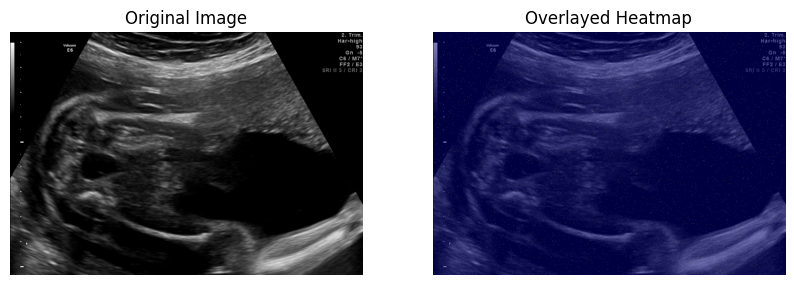

Other
(392, 640, 3)


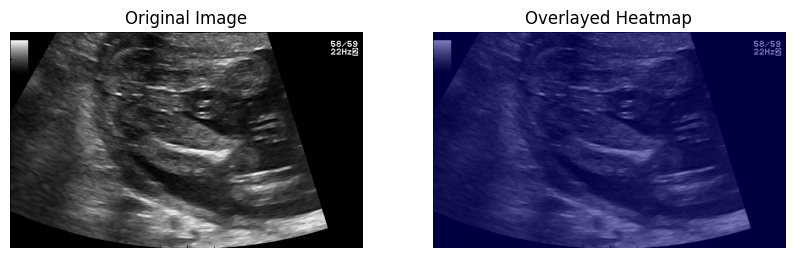

Other
(787, 1137, 3)


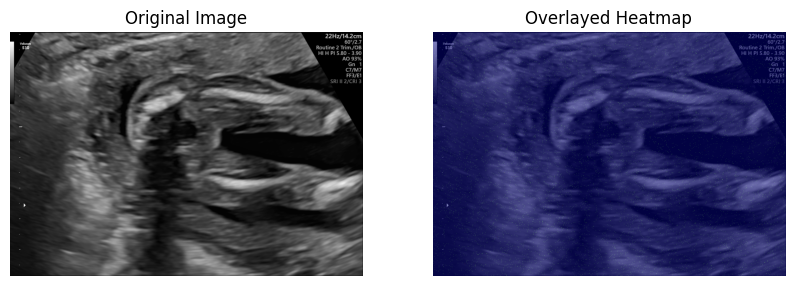

Other
(661, 959, 3)


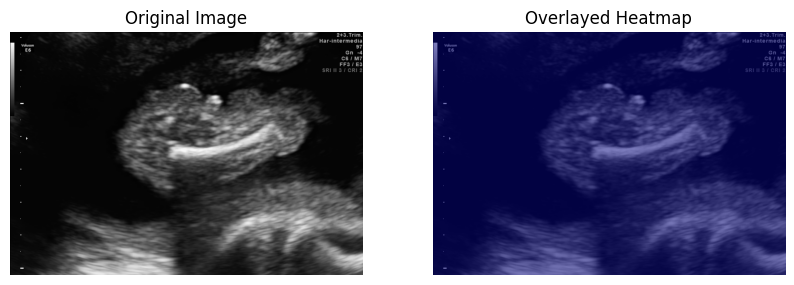

Fetal thorax
(448, 740, 3)


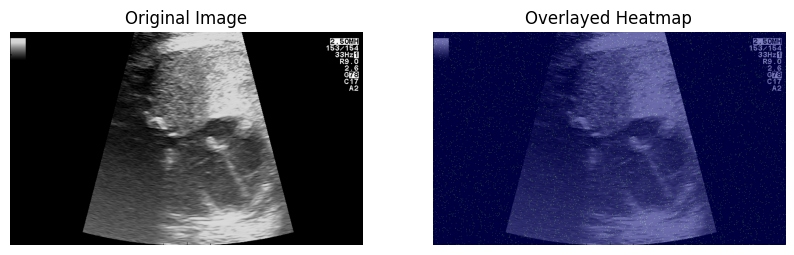

Fetal thorax
(661, 959, 3)


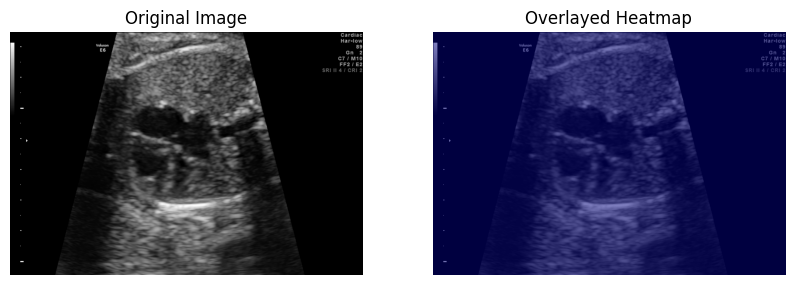

Error processing image Patient00790_Plane6_4_of_4: Error code: 400 - {'error': {'message': 'Timeout while downloading https://mvpimages1.s3.amazonaws.com/Patient00790_Plane6_4_of_4.png.', 'type': 'invalid_request_error', 'param': None, 'code': 'invalid_image_url'}}
Fetal thorax
(661, 959, 3)


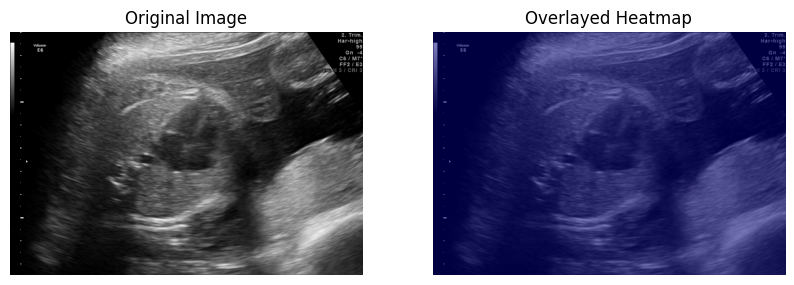

Fetal femur
(787, 1137, 3)


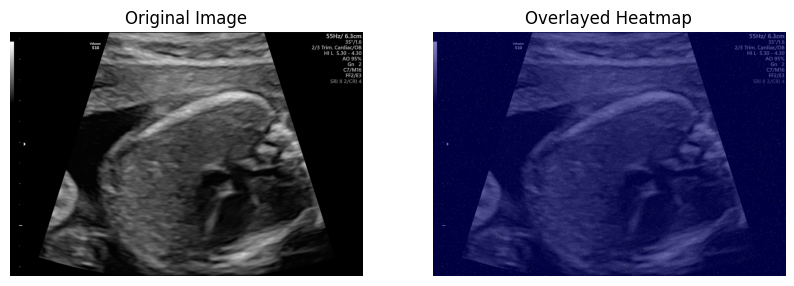

Fetal brain
(661, 959, 3)


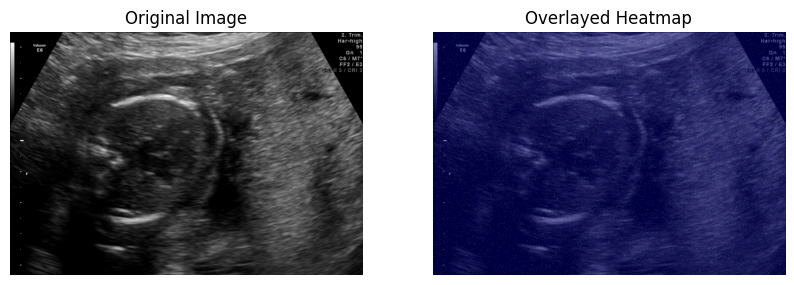

Other
(663, 961, 3)


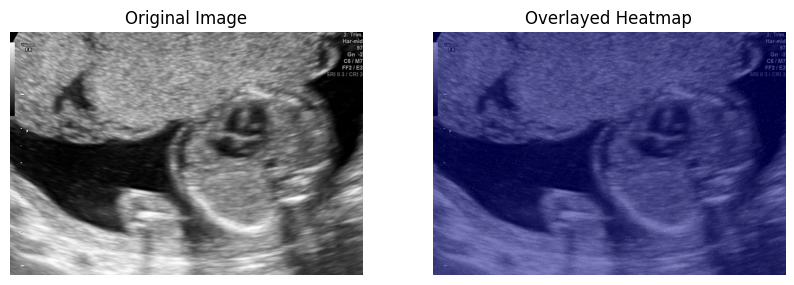

Fetal abdomen
(787, 1137, 3)


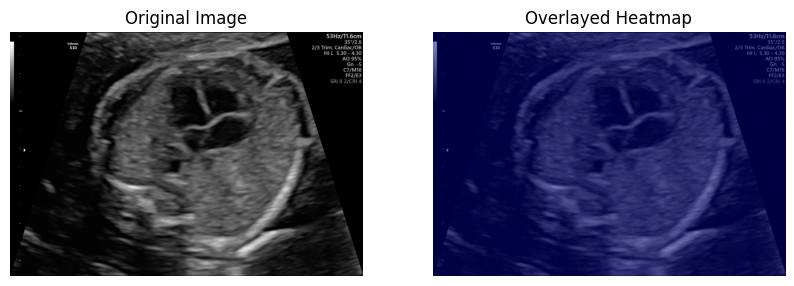

Fetal abdomen
(787, 1137, 3)


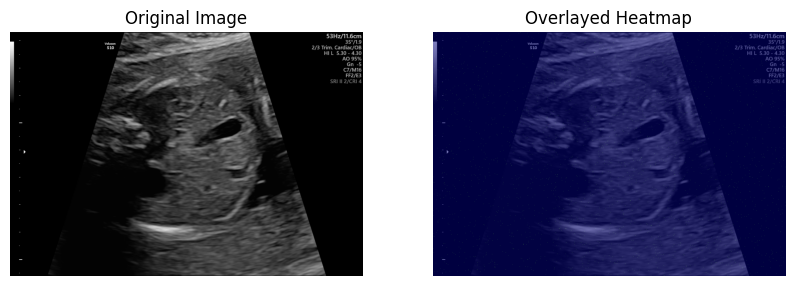

Fetal abdomen
(661, 959, 3)


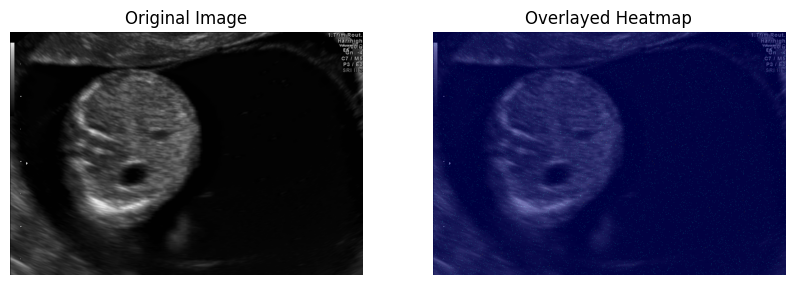

Fetal abdomen
(787, 1137, 3)


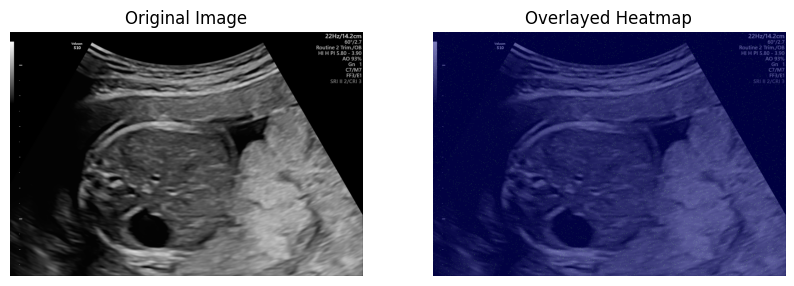

Fetal abdomen
(661, 959, 3)


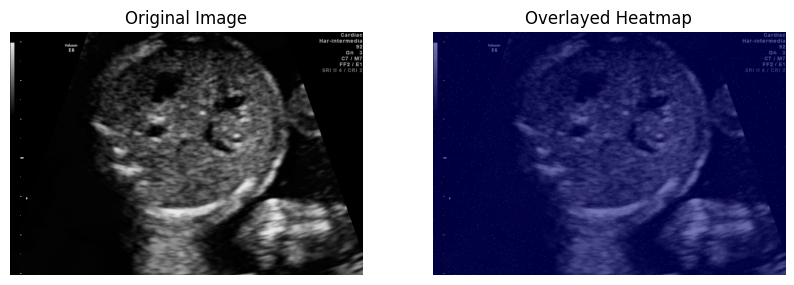

Other
(787, 1137, 3)


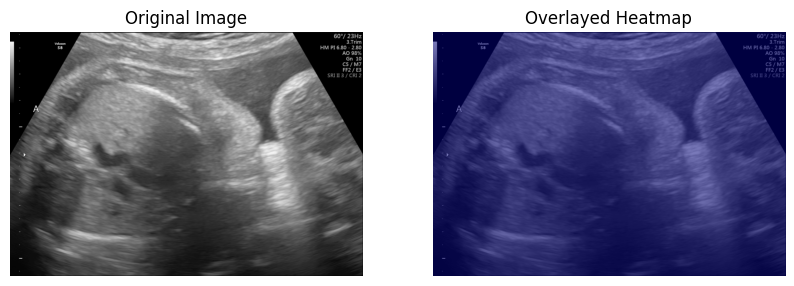

Other
(392, 640, 3)


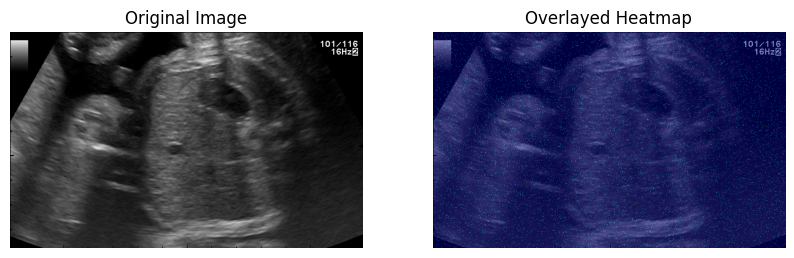

Fetal thorax
(661, 959, 3)


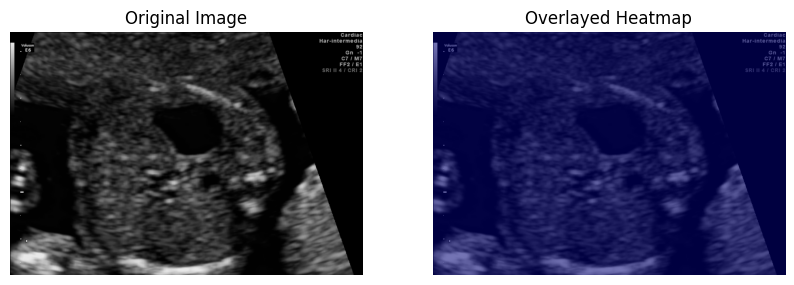

Fetal brain
(663, 961, 3)


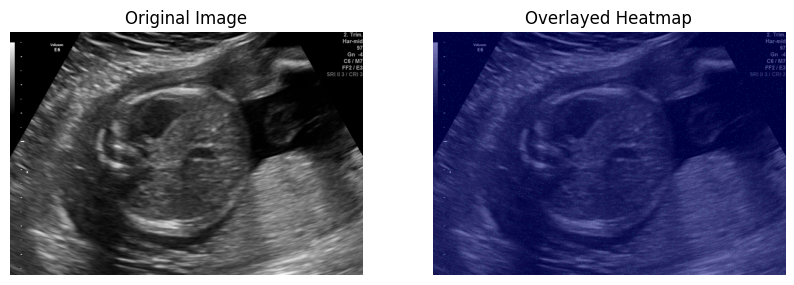

In [ ]:

client = OpenAI()
def get_confidence_score(image_url, prediction):
    image_url = image_url + ".png"
    completion = client.chat.completions.create(
        model='ft:gpt-4o-2024-08-06:attri::AKYGXHDK',
        messages=[
            {"role": "system", "content": "You are an assistant that identifies fetal ultrasound planes."},
            {"role": "user", "content": f"What is the confidence score that the following plane is {prediction}? Answer should be a percentage number, necessarily an integer. Do not give anything else, any text in the output response"},
            {"role": "user", "content": [{"type": "image_url", "image_url": {"url": "{INSERT S3 IMAGE URL}" + image_url, "detail": "low"}}]}
        ]
    )
    return float(completion.choices[0].message.content)
def generate_heatmap(image, confidence_score):
    height, width, _ = image.shape
    heatmap = np.zeros((height, width), dtype=np.float32)

    for _ in range(int(confidence_score * 100)):
        y = random.randint(0, height - 1)
        x = random.randint(0, width - 1)
        heatmap[y, x] += 1

    heatmap = cv2.normalize(heatmap, None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX)
    heatmap = np.uint8(heatmap)

    heatmap_colored = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

    return heatmap_colored

def overlay_heatmap(original_image, heatmap, alpha=0.5):
    overlayed_image = cv2.addWeighted(original_image, alpha, heatmap, 1 - alpha, 0)
    return overlayed_image

def process_images_and_generate_heatmaps(df, num_instances=4):
    matched_images = df[df['Plane'] == df['Prediction']]
    unmatched_images = df[df['Plane'] != df['Prediction']]

    plane_classes = df['Plane'].unique()

    selected_samples = []

    for plane_class in plane_classes:
        matched_samples = matched_images[matched_images['Plane'] == plane_class]
        if not matched_samples.empty:
            correct_samples = matched_samples.sample(n=min(num_instances, len(matched_samples)), random_state=42)
            selected_samples.append(correct_samples)

        unmatched_samples = unmatched_images[unmatched_images['Plane'] == plane_class]
        if not unmatched_samples.empty:
            incorrect_samples = unmatched_samples.sample(n=min(num_instances, len(unmatched_samples)), random_state=42)
            selected_samples.append(incorrect_samples)

    selected_samples_df = pd.concat(selected_samples)

    for index, row in selected_samples_df.iterrows():
        image_url = row['Image_name']
        prediction = row['Prediction']

        try:
            confidence_score = get_confidence_score(image_url, prediction)
            image_url = image_url + ".png"
            print(prediction)
            image = cv2.imread("/content/Images/" + image_url)
            print(image.shape)

            heatmap = generate_heatmap(image, confidence_score)

            overlayed_image = overlay_heatmap(image, heatmap)

            plt.figure(figsize=(10, 10))
            plt.subplot(1, 2, 1)
            plt.title("Original Image")
            plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
            plt.axis('off')

            plt.subplot(1, 2, 2)
            plt.title("Overlayed Heatmap")
            plt.imshow(cv2.cvtColor(overlayed_image, cv2.COLOR_BGR2RGB))
            plt.axis('off')

            plt.show()
        except Exception as e:
            print(f"Error processing image {image_url}: {e}")
            continue

csv_file = '/content/results_with_predictions_full.csv'

df = pd.read_csv(csv_file)

df.dropna(subset=['Prediction'], inplace=True)

process_images_and_generate_heatmaps(df, num_instances=4)


In [ ]:
#ft:gpt-4o-2024-08-06:attri::AKETvkyA
#'ft:gpt-4o-2024-08-06:attri::AKYGXHDK'
#'ftjob-KaxozpsXYAPu4h1Ykg6Kly7l'
# ftjob-cJZfFJIQ2Ob3krkS6GLmlFuB